In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json # for reading the tr
import glob # for creating lists of files
import nibabel as nib # for reading in your brain data
from nilearn import plotting # for vizualizing brain data
from nilearn import surface
from nilearn.plotting import plot_design_matrix, plot_contrast_matrix
from nilearn.glm.first_level import FirstLevelModel
from nilearn import datasets
from nilearn import signal

In [3]:
base_dir = '/Users/ayaaburous/Desktop/fmriproject'

sub4 = 'sub-4'
sub5 = 'sub-5'
ses = 'ses-1'
task = 'bold'

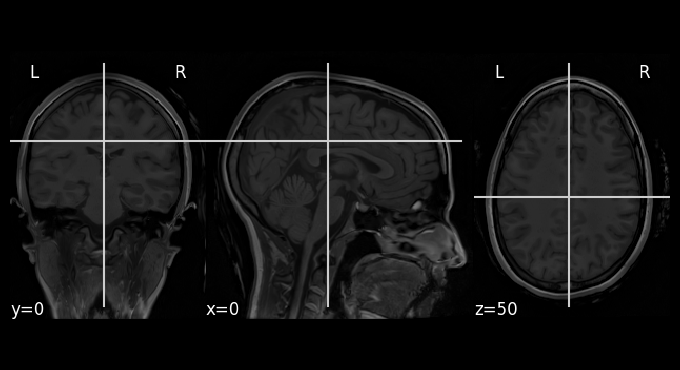

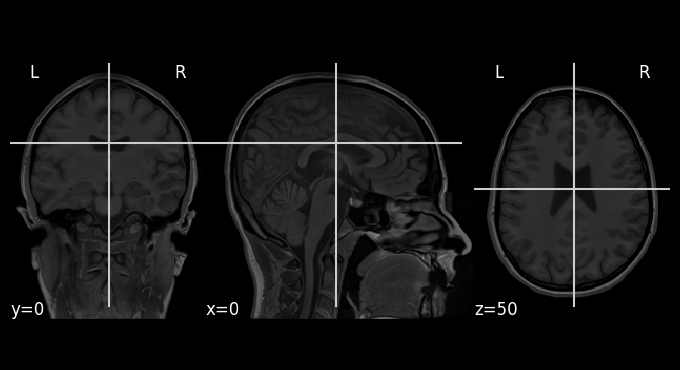

In [4]:
native_t1_path = f'{base_dir}/fmriprep/{sub4}/{ses}/anat/{sub4}_{ses}_desc-preproc_T1w.nii.gz' 
native_t1 = nib.load(native_t1_path)

native_t2_path = f'{base_dir}/fmriprep/{sub5}/{ses}/anat/{sub5}_{ses}_desc-preproc_T1w.nii.gz' 
native_t2 = nib.load(native_t2_path)


plotting.plot_anat(native_t1, cut_coords=(0,0,50))
plotting.plot_anat(native_t2, cut_coords=(0,0,50))

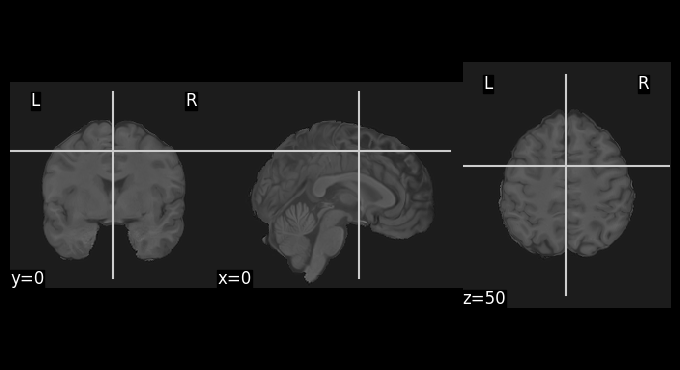

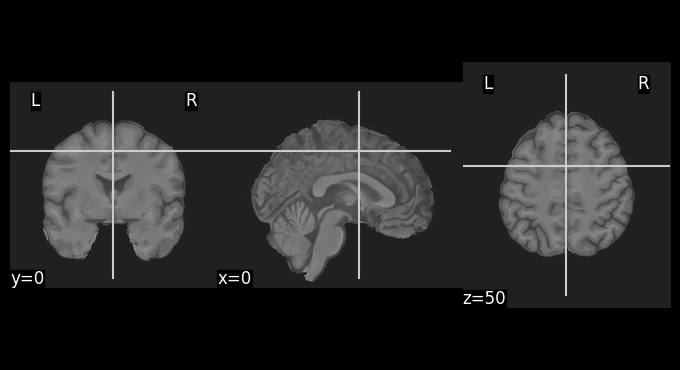

In [5]:
mni_t1_path = f'{base_dir}/fmriprep/{sub4}/{ses}/anat/{sub4}_{ses}_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz' 
mni_t1 = nib.load(mni_t1_path)

mni_t2_path = f'{base_dir}/fmriprep/{sub5}/{ses}/anat/{sub5}_{ses}_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz' 
mni_t2 = nib.load(mni_t2_path)

plotting.plot_anat(mni_t1, cut_coords=(0,0,50))
plotting.plot_anat(mni_t2, cut_coords=(0,0,50))

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



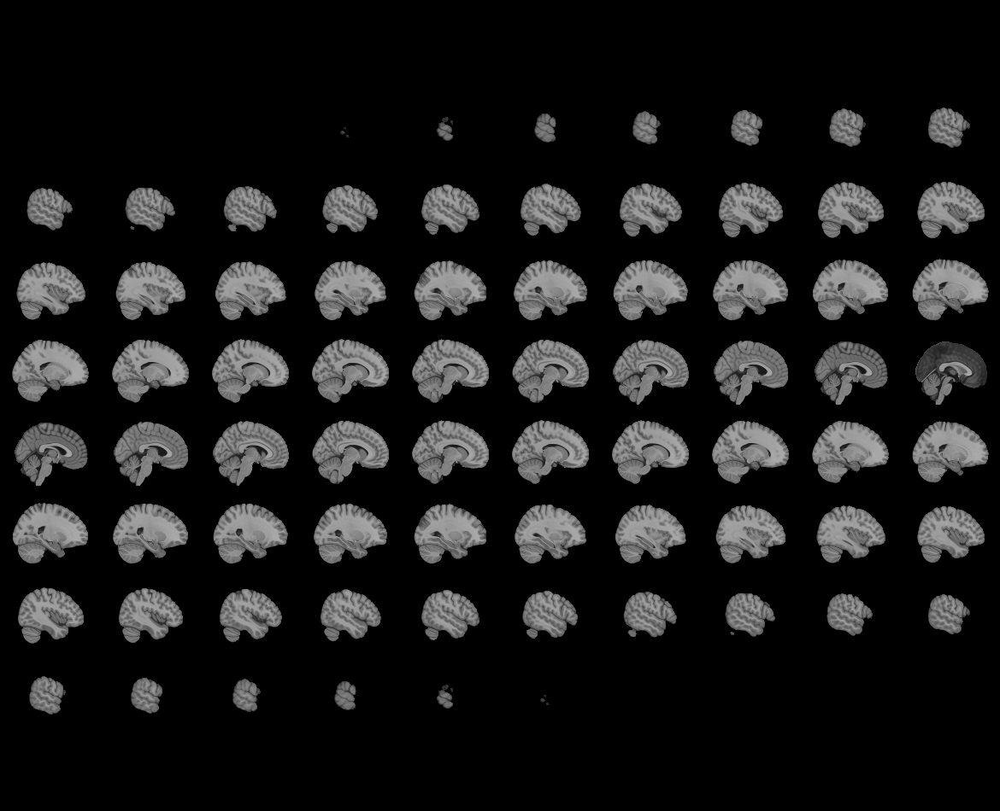
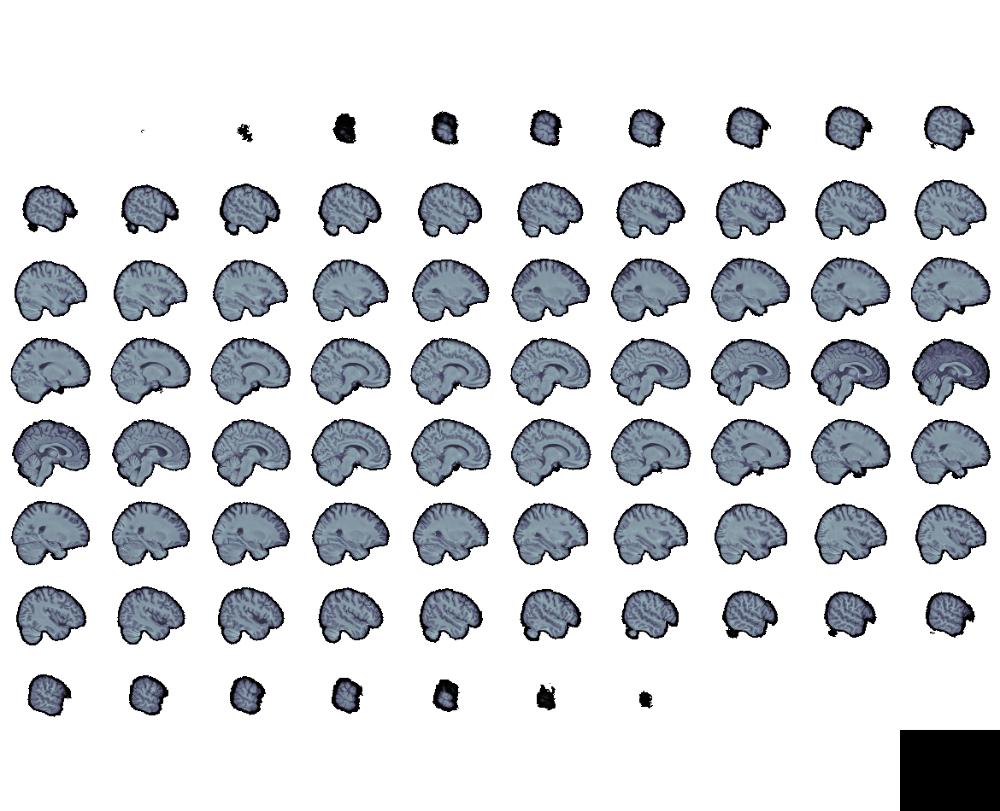

In [6]:
plotting.view_img(mni_t1,cmap='brown_blue')

plotting.view_img(mni_t2,cmap='brown_blue')

In [7]:
# fsnative_lh = surface.load_surf_mesh(f'{base_dir}/freesurfer/{sub4}/surf/lh.curv.pial')
# fsnative_rh = surface.load_surf_mesh(f'{base_dir}/freesurfer/{sub4}/surf/rh.curv.pial')

fsnative_lh4 = surface.load_surf_mesh(f'{base_dir}/fmriprep/{sub4}/{ses}/anat/{sub4}_{ses}_hemi-L_pial.surf.gii')
fsnative_rh4 = surface.load_surf_mesh(f'{base_dir}/fmriprep/{sub4}/{ses}/anat/{sub4}_{ses}_hemi-R_pial.surf.gii')

fsnative_lh5 = surface.load_surf_mesh(f'{base_dir}/fmriprep/{sub5}/{ses}/anat/{sub5}_{ses}_hemi-L_pial.surf.gii')
fsnative_rh5 = surface.load_surf_mesh(f'{base_dir}/fmriprep/{sub5}/{ses}/anat/{sub5}_{ses}_hemi-R_pial.surf.gii')

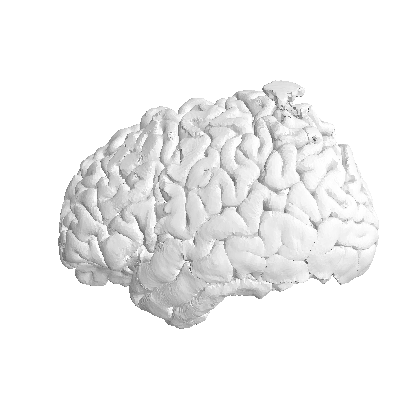

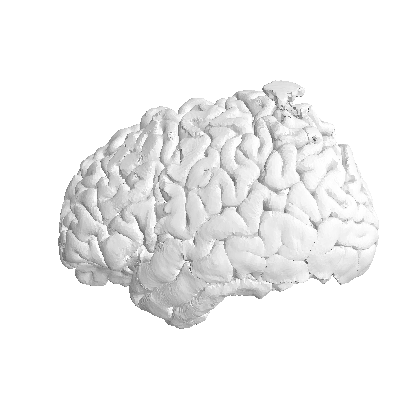

In [8]:
plotting.plot_surf(fsnative_lh4,hemi='left')

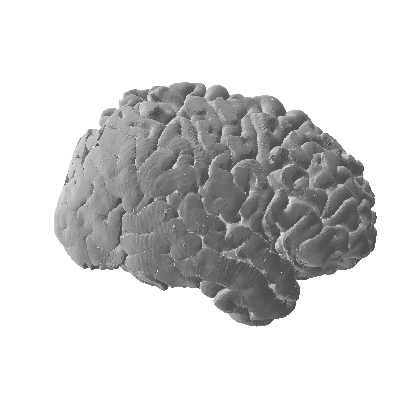

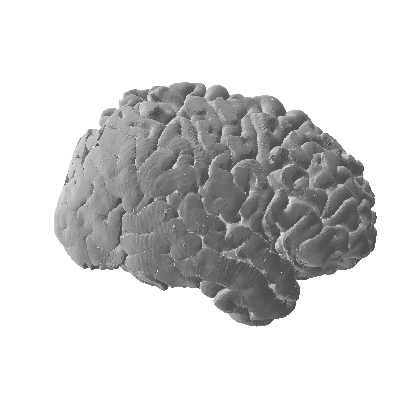

In [9]:
plotting.plot_surf(fsnative_rh4,hemi='right')

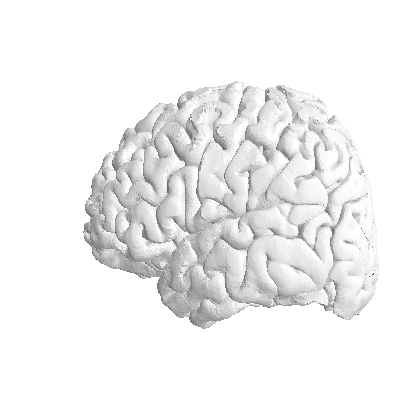

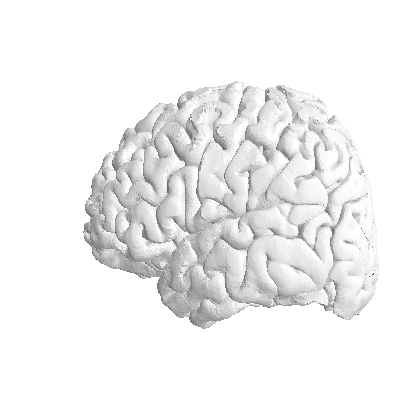

In [10]:
plotting.plot_surf(fsnative_lh5,hemi='left')

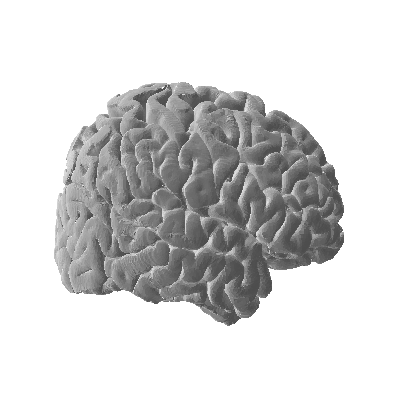

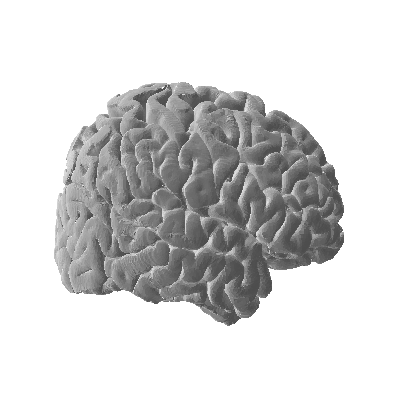

In [11]:
plotting.plot_surf(fsnative_rh5,hemi='right')

In [12]:
fsaverage = datasets.fetch_surf_fsaverage()

fsaverage_lh4 = surface.load_surf_mesh(fsaverage['pial_left'])
fsaverage_rh4 = surface.load_surf_mesh(fsaverage['pial_right'])


fsaverage_lh5 = surface.load_surf_mesh(fsaverage['pial_left'])
fsaverage_rh5 = surface.load_surf_mesh(fsaverage['pial_right'])

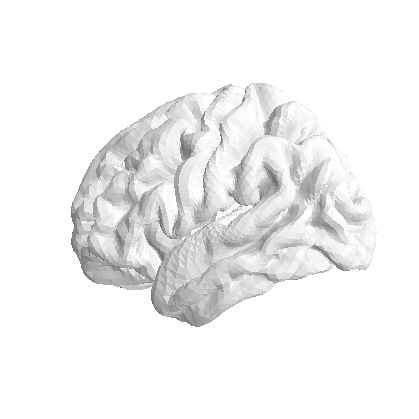

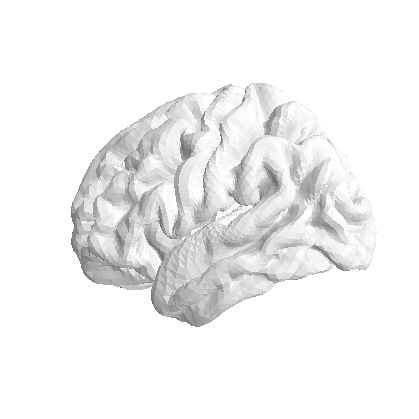

In [13]:
plotting.plot_surf(fsaverage_lh4,hemi='left')

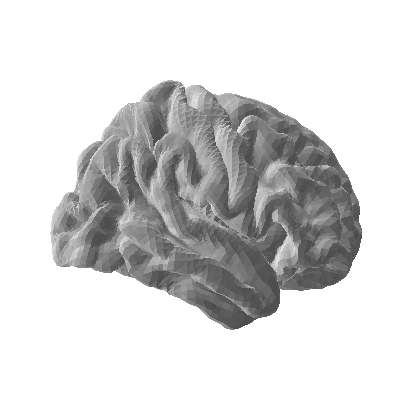

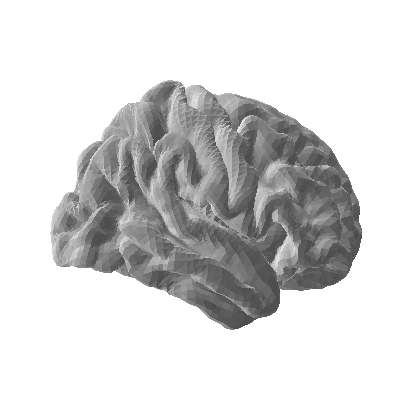

In [14]:
plotting.plot_surf(fsaverage_rh4,hemi='right')

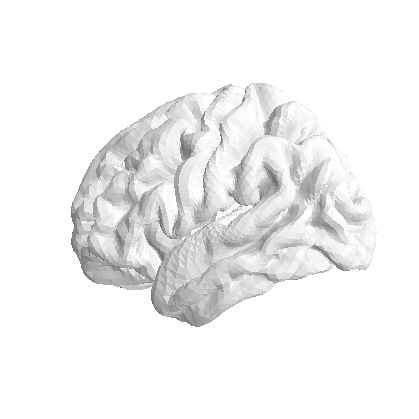

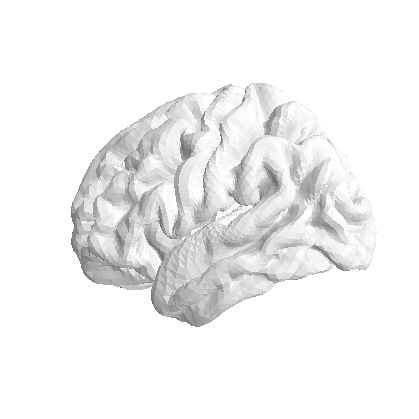

In [15]:
plotting.plot_surf(fsaverage_lh5,hemi='left')

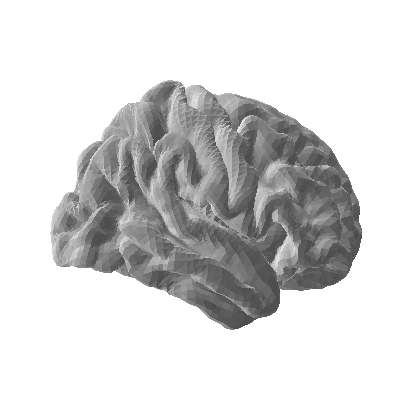

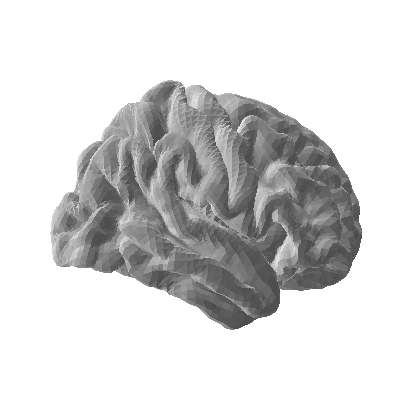

In [16]:
plotting.plot_surf(fsaverage_rh5,hemi='right')

In [17]:
plotting.view_surf(surf_mesh=fsaverage_lh4,colorbar=False)

In [18]:
plotting.view_surf(surf_mesh=fsaverage_rh4,colorbar=False)

In [19]:
plotting.view_surf(surf_mesh=fsaverage_lh5,colorbar=False)

In [20]:
plotting.view_surf(surf_mesh=fsaverage_rh5,colorbar=False)

In [58]:

image_paths = []
json_paths = []
events_paths = []

for sub in ['sub-4', 'sub-5']:
    image_paths += glob.glob(f'{base_dir}/fmriprep/{sub}/{ses}/func/{sub}_{ses}_task-{task}_run-*_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
    json_paths += glob.glob(f'{base_dir}/fmriprep/{sub}/{ses}/func/{sub}_{ses}_task-{task}_run-*_space-MNI152NLin2009cAsym_desc-preproc_bold.json')
    events_paths += glob.glob(f'{base_dir}/events_csv/{sub}_{ses}_task-{task}_run-*_events.csv')

image_paths.sort()
json_paths.sort()
events_paths.sort()

print("Image Paths:", image_paths)
print("JSON Paths:", json_paths)
print("Events Paths:", events_paths)

images = []
for img in image_paths:
    func_img = nib.load(img)
    images.append(func_img)

print(images)

Image Paths: ['/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-4/ses-1/func/sub-4_ses-1_task-bold_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz', '/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-4/ses-1/func/sub-4_ses-1_task-bold_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz', '/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-5/ses-1/func/sub-5_ses-1_task-bold_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz', '/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-5/ses-1/func/sub-5_ses-1_task-bold_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz']
JSON Paths: ['/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-4/ses-1/func/sub-4_ses-1_task-bold_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.json', '/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-4/ses-1/func/sub-4_ses-1_task-bold_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.json', '/Users/ayaaburous/Desktop/fmriproject/fmriprep/sub-5/ses-1/func/sub-5_ses-1_task-bold_run-1_space-MN

In [48]:
# read in and create a list of all the events files (PsychoPy output)
events_dfs = []

# if you named your conditions as numbers when setting up PsychoPy, it's bester to rename then to a string
conditionText_to_conditionName = {
    'L1': 'Condition 1',
    'L2': 'Condition 2',
    'blank': 'Blank Condition'
}


for csv in events_paths:
    # Read the CSV file
    events = pd.read_csv(csv)
    
    # Ensure necessary columns exist
    if 'Blank.started' in events.columns and 'Body.started' in events.columns and 'Body.stopped' in events.columns:
        # Calculate scan start time
        scan_start_time = np.nanmin(np.unique(events['Blank.started']))
        
        # Filter out rows not part of the task
        events.dropna(subset=['Body.started'], inplace=True)
        
        # Calculate onset and duration
        events['onset'] = events['Body.started'] - scan_start_time
        events['duration'] = events['Body.started'] - events['Body.stopped']
        
        # Map `textType` to descriptive trial type names
        if 'textType' in events.columns:
            events['trial_type'] = events['textType'].map(conditionText_to_conditionName)
        
        # Remove blank trials
        events = events.query('trial_type != "Blank Condition"')
        
        # Append processed DataFrame to the list
        events_dfs.append(events)
    else:
        print(f"File {csv} is missing required columns and will be skipped.")

# Print summary of processed files
for i, df in enumerate(events_dfs, start=1):
    print(f"Processed file {i}: {df.shape[0]} rows.")

print(events_dfs)

Processed file 1: 14 rows.
Processed file 2: 15 rows.
Processed file 3: 14 rows.
Processed file 4: 15 rows.
[   textType                                               Text thisN  \
2        L1  تشتهر منطقة حوض البحر الأبيض المتوسّط بزراعة أ...     0   
3        L2  Naval architects never claim that a ship is un...     1   
4        L1  شار وزير الإسكان وشؤون البلدية في المملكة العر...     2   
5        L1  تعد مجالات البرمجة، والتصميم، ومونتاج الفيديو ...     3   
6        L2  Dolphins are regarded as the friendliest creat...     4   
7    blank                                                   +     5   
8        L2  Opera refers to a dramatic art form, originati...     6   
9        L2  Stingrays are diamond-shaped fish with long ta...     7   
10   blank                                                   +     8   
11   blank                                                   +     9   
12       L1  يُعرف الفضاء بأنّه الفراغ الموجود ما بين الأجر...    10   
13   blank                 

In [55]:
# check the tr for the experriment - should be 1.19 for all the runs
for file in json_paths:
    t_r = json.load(open(file))['RepetitionTime']
    print(t_r)

1.19
1.19
1.19
1.19


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/nilearn/glm/first_level/experimental_paradigm.py:167: UserWarning: The following unexpected columns in events data will be ignored: Body_Text.stopped, End_Text.stopped, Intro_Key_Resp.rt, notes, trials.thisRepN, participant, Intro_Text.started, Body.started, Blank.started, thisRow.t, text.stopped, Body.stopped, End.started, psychopyVersion, thisRepN, date, thisTrialN, Text, trials.thisN, Unnamed: 37, End.stopped, text.started, Unnamed: 38, session, Introduction.started, Blank.stopped, expName, Body_Text.started, Intro_Key_Resp.keys, trials.thisTrialN, Introduction.stopped, Intro_Key_Resp.duration, thisN, textType, Intro_Key_Resp.started, trials.thisIndex, End_Text.started, frameRate, expStart
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/nilearn/glm/first_level/experimental_paradigm.py:198: UserWarning: Duplicated events were detected. Amplitudes of these e

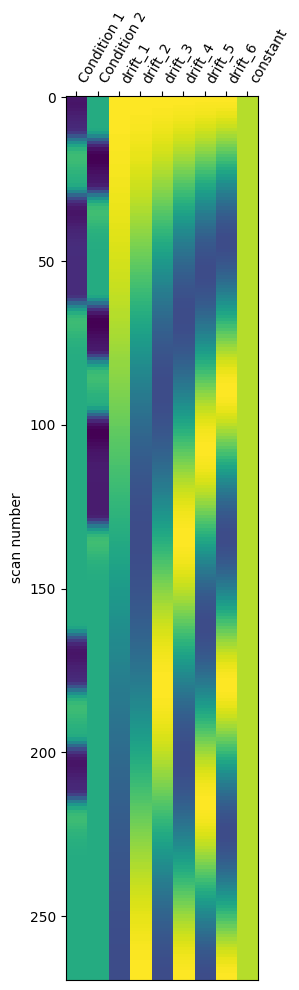

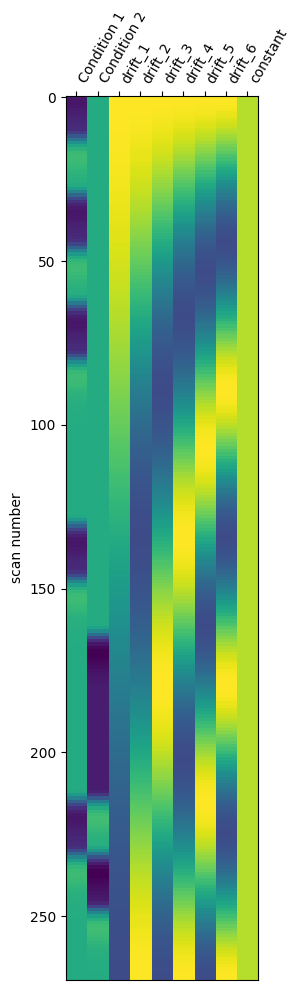

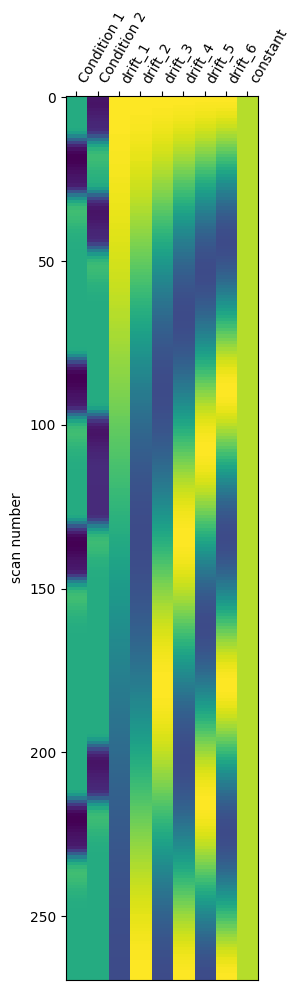

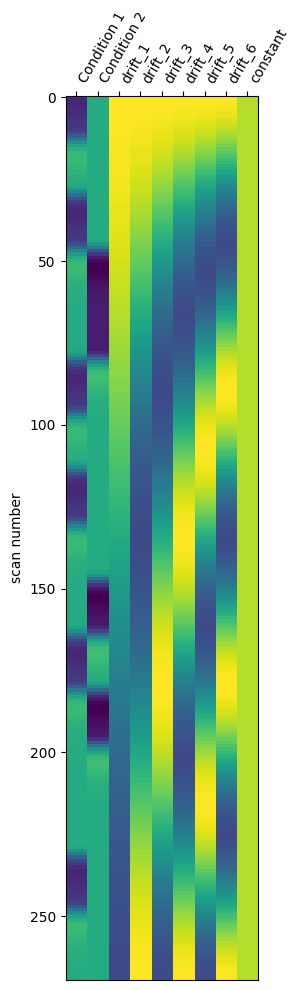

In [59]:
# Fit first level model with no HRF -- set signal_scaling to False so predictions are on same scale as observed
first_level_model = FirstLevelModel(t_r,hrf_model='SPM')

first_level_model_fit = first_level_model.fit(images, events=events_dfs)

# Grab the desing matrix and plot
for dmx in first_level_model_fit.design_matrices_:
    plot_design_matrix(dmx)
    
    plt.show()
  

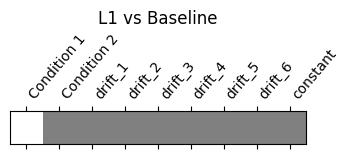

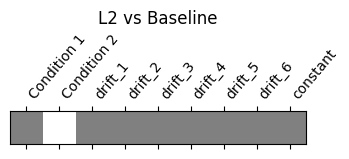

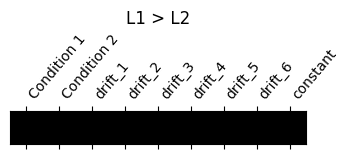

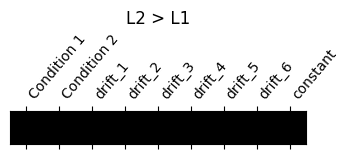

In [64]:
import numpy as np
from nilearn.plotting import plot_contrast_matrix

# Specify your contrasts
# Grab a design matrix to specify the order of conditions in the contrast
design_matrix = first_level_model_fit.design_matrices_[0]

# Create a simple contrast for each column of the design matrix
contrast_matrix = np.eye(design_matrix.shape[1])
contrasts = {
    column: contrast_matrix[i]
    for i, column in enumerate(design_matrix.columns)
}

# Specify the contrasts of interest for your experiment
contrasts = {
    "L1-blank": (
        contrasts["Condition 1"]  # Compare L1 activity to baseline
    ),
    "L2-blank": (
        contrasts["Condition 2"]  # Compare L2 activity to baseline
    ),
    "L1-L2": (
        contrasts["Condition 1"] - contrasts["Condition 1"]  # Compare L1 activity to L2
    ),
    "L2-L1": (
        contrasts["Condition 2"] - contrasts["Condition 2"]  # Compare L2 activity to L1
    ),
}

# Plot the contrast matrices for visualization
plot_contrast_matrix(contrasts["L1-blank"], design_matrix)
plt.title("L1 vs Baseline")  # Set title manually
plt.show()

plot_contrast_matrix(contrasts["L2-blank"], design_matrix)
plt.title("L2 vs Baseline")  # Set title manually
plt.show()

plot_contrast_matrix(contrasts["L1-L2"], design_matrix)
plt.title("L1 > L2")  # Set title manually
plt.show()

plot_contrast_matrix(contrasts["L2-L1"], design_matrix)
plt.title("L2 > L1")  # Set title manually
plt.show()




In [71]:
import numpy as np

# Create a contrast matrix for all columns in the design matrix
contrast_matrix = np.eye(design_matrix.shape[1])

# Map the contrasts to the actual design matrix columns
contrasts = {
    "Condition1-blank": contrast_matrix[design_matrix.columns.get_loc("Condition 1")],
    "Condition2-blank": contrast_matrix[design_matrix.columns.get_loc("Condition 2")],
    "Condition1-Condition2": (
        contrast_matrix[design_matrix.columns.get_loc("Condition 1")]
        - contrast_matrix[design_matrix.columns.get_loc("Condition 2")]
    ),
    "Condition2-Condition1": (
        contrast_matrix[design_matrix.columns.get_loc("Condition 2")]
        - contrast_matrix[design_matrix.columns.get_loc("Condition 1")]
    ),
}


stat_maps=[]
for index, (contrast_id, contrast_val) in enumerate(contrasts.items()):
    stat_map = first_level_model_fit.compute_contrast(
        contrast_val, stat_type = 't', output_type= 'stat',)
    stat_maps.append(stat_map)


/var/folders/v6/nhf91_mx06v6bmp0g5bkky0h0000gn/T/ipykernel_18202/1461192997.py:23: UserWarning: One contrast given, assuming it for all 4 runs
  stat_map = first_level_model_fit.compute_contrast(


/var/folders/v6/nhf91_mx06v6bmp0g5bkky0h0000gn/T/ipykernel_18202/332010664.py:6: UserWarning: One contrast given, assuming it for all 4 runs
  stat_map = first_level_model_fit.compute_contrast(


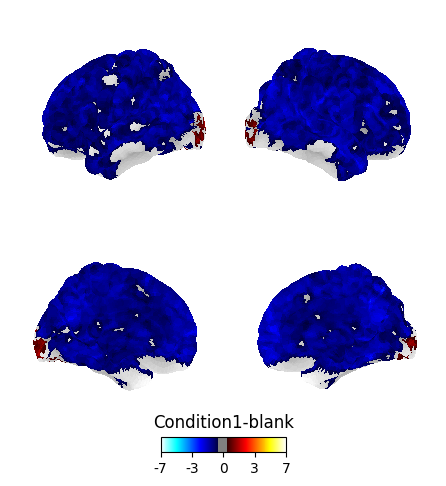

/var/folders/v6/nhf91_mx06v6bmp0g5bkky0h0000gn/T/ipykernel_18202/332010664.py:6: UserWarning: One contrast given, assuming it for all 4 runs
  stat_map = first_level_model_fit.compute_contrast(


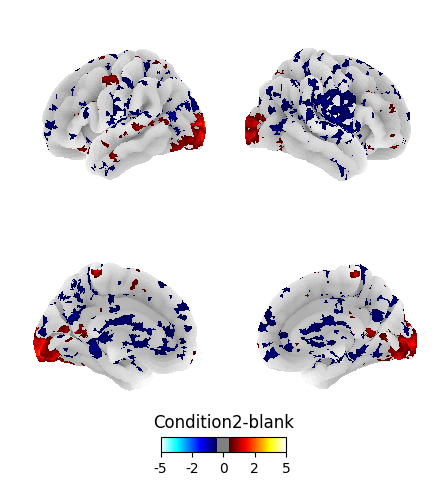

/var/folders/v6/nhf91_mx06v6bmp0g5bkky0h0000gn/T/ipykernel_18202/332010664.py:6: UserWarning: One contrast given, assuming it for all 4 runs
  stat_map = first_level_model_fit.compute_contrast(


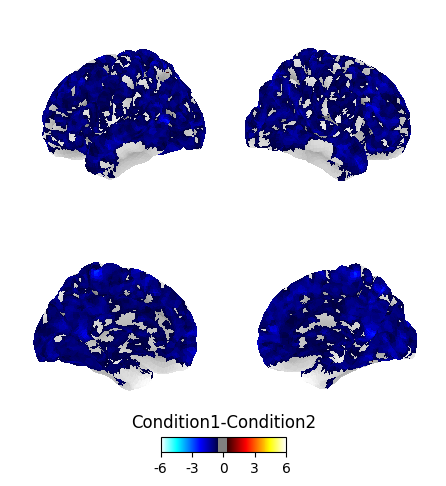

/var/folders/v6/nhf91_mx06v6bmp0g5bkky0h0000gn/T/ipykernel_18202/332010664.py:6: UserWarning: One contrast given, assuming it for all 4 runs
  stat_map = first_level_model_fit.compute_contrast(


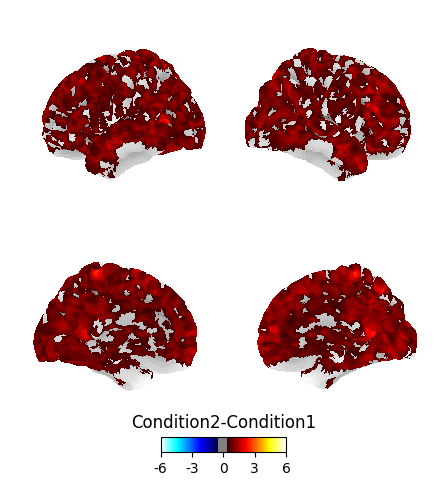

In [74]:
#plot the statistical contrast map on the surface
# plotting.plot_img_on_surf(stat_map=stat_maps[3],surf_mesh='fsaverage5',threshold=.5)


for i, (contrast_id, contrast_val) in enumerate(contrasts.items()):
    stat_map = first_level_model_fit.compute_contrast(
        contrast_val, stat_type='t', output_type='stat'
    )
    plotting.plot_img_on_surf(stat_map=stat_map, surf_mesh='fsaverage5', threshold=0.5)
    plt.title(contrast_id)  # Label the plot with the contrast name
    plt.show()


In [73]:
#plot the statistical contrast map on the surface in an interactive viewer
plotting.view_img_on_surf(stat_map_img=stat_maps[2],surf_mesh='fsaverage5',threshold=3.0)